# Importing Necessary Libraries

### In this code segment, we begin by importing essential Python libraries that serve various crucial roles in our data analysis and machine learning project. Each library has a specific purpose and brings valuable functionalities to our code:

### By importing these libraries, we equip our code with a robust set of tools and capabilities for data preprocessing, visualization, modeling, and evaluation, ensuring a comprehensive and efficient analysis process.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier


from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import precision_score,recall_score, f1_score
from sklearn.metrics import plot_roc_curve

from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

# Data Collection and Data Preprocessing

In [2]:
df = pd.read_csv('/Users/sharanappabiradar/Downloads/Company_x.csv')

In [3]:
df.head()

,EntityID,OriginalCreditor[Redacted],AccountID,CurrentBalance,DebtLoadPrincipal,BalanceAtDebtLoad,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,...,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25
0,932,Creditor 1,3677,0.00,"1,160.20","1,160.20",4.22,Other,PAID_IN_FULL,N,...,Cheque,1.0,53.0,0,0,1,NaN,NaN,NaN,NaN
1,160,Creditor 2,4276,182.90,182.90,182.90,4.22,Other,CANCELLED_WITHDRAWN,Y,...,NaN,1.0,NaN,0,0,1,NaN,NaN,NaN,NaN
2,932,Creditor 1,8525,0.00,538.57,538.57,4.22,Other,PAID_IN_FULL,N,...,Cheque,1.0,NaN,1,0,1,NaN,NaN,NaN,NaN
3,160,Creditor 2,9859,"8,279.50","8,279.50","8,279.50",4.22,Other,PASSIVE,Y,...,NaN,1.0,NaN,1,0,1,NaN,NaN,NaN,NaN
4,932,Creditor 1,12807,0.00,523.00,523.00,4.22,Other,PAID_IN_FULL,Y,...,Cheque,1.0,46.0,2,0,1,NaN,NaN,NaN,NaN


In [4]:
df.shape

(406423, 26)

# Data Cleaning

### data quality check by counting the number of missing (or NaN) values in each column of a DataFrame 
### This information is crucial for data preprocessing because it helps you identify columns with missing data, assess the extent of missingness, and decide on appropriate strategies for handling missing values, such as imputation or removal of rows or columns with excessive missing data.

In [5]:
df.isna().sum()

EntityID                           0
OriginalCreditor[Redacted]         0
AccountID                          0
CurrentBalance                     0
DebtLoadPrincipal                  0
BalanceAtDebtLoad                  0
PurchasePrice                   2692
ProductOrDebtType                  0
CollectionStatus                   0
IsStatBarred                       0
ClosureReason                 397393
InBankruptcy                       0
AccountInsolvencyType         406138
CustomerInsolvencyType        397892
IsLegal                            0
LastPaymentAmount             302446
LastPaymentMethod             302446
NumLiableParties                 122
CustomerAge                    29482
NumPhones                          0
NumEmails                          0
NumAddresses                       0
Unnamed: 22                   406423
Unnamed: 23                   406423
Unnamed: 24                   406423
Unnamed: 25                   406422
dtype: int64

In [6]:
data=df.drop(['ClosureReason', 'AccountInsolvencyType','CustomerInsolvencyType','LastPaymentAmount','LastPaymentMethod','Unnamed: 22','Unnamed: 23','Unnamed: 24','Unnamed: 25'], axis=1)

In [7]:
data.isna().sum()

EntityID                          0
OriginalCreditor[Redacted]        0
AccountID                         0
CurrentBalance                    0
DebtLoadPrincipal                 0
BalanceAtDebtLoad                 0
PurchasePrice                  2692
ProductOrDebtType                 0
CollectionStatus                  0
IsStatBarred                      0
InBankruptcy                      0
IsLegal                           0
NumLiableParties                122
CustomerAge                   29482
NumPhones                         0
NumEmails                         0
NumAddresses                      0
dtype: int64

In [8]:
data['IsStatBarred'].value_counts(normalize=True)

Y    0.700128
N    0.299872
Name: IsStatBarred, dtype: float64

In [9]:
data['CustomerAge'] = data['CustomerAge'].abs()

In [10]:
data['CustomerAge']

0         53.0
1          NaN
2          NaN
3          NaN
4         46.0
          ... 
406418    36.0
406419    37.0
406420    71.0
406421    38.0
406422    30.0
Name: CustomerAge, Length: 406423, dtype: float64

In [11]:
data.CustomerAge.unique()

array([ 53.,  nan,  46.,  50.,  45.,  66.,  78.,  52.,  59.,  68.,  60.,
        43.,  74.,  58.,  61.,  56.,  90.,  51.,  70.,  64.,  44.,  47.,
        65.,  75.,  54.,  63.,  77.,  57.,  55.,  67.,  49.,  85.,  72.,
        71.,  82.,  28.,  62.,  48.,  80.,  73.,  79.,  81.,  69.,  84.,
        32.,  42.,  29.,  33.,  35.,  37.,  41.,  27.,  31.,  39., 109.,
        38.,  36.,  94.,  30.,  76.,  83., 101.,  34.,  40.,  97.,  96.,
        91., 103., 106., 113., 104., 107.,  26., 102.,  86.,  88.,  87.,
        98., 121.,  95., 115., 111.,  89.,  25.,  99.,  92., 105.,  24.,
        93., 100., 108.,  23.,  10.,   4.,  22.,   3., 119.,  21.,  20.,
        19.,  18.,   1.,  17.,  16.,   6.,   5., 110., 112., 120., 114.,
        14.,   9.,  15.,   7.,  12., 132., 133.,  11.,  13.])

In [12]:

# Create a DataFrame
df = pd.DataFrame(data)

# Calculate the mode of the 'customerage' column
mode = df['CustomerAge'].mode()[0]

# Define a range around the mode (e.g., +/- 2 years)
range_around_mode = 2

# Calculate the Upper Limit (UL) and Lower Limit (LL)
UL = mode + range_around_mode
LL = mode - range_around_mode

# Impute values outside the UL and LL
df['CustomerAge'] = df['CustomerAge'].apply(lambda x: UL if x > UL else (LL if x < LL else x))



In [13]:
df['CustomerAge'].fillna(mode, inplace=True)

In [14]:
df.CustomerAge.unique()

array([40., 38., 36., 37., 39.])

In [15]:
df.head()

,EntityID,OriginalCreditor[Redacted],AccountID,CurrentBalance,DebtLoadPrincipal,BalanceAtDebtLoad,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,InBankruptcy,IsLegal,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses
0,932,Creditor 1,3677,0.00,"1,160.20","1,160.20",4.22,Other,PAID_IN_FULL,N,N,Y,1.0,40.0,0,0,1
1,160,Creditor 2,4276,182.90,182.90,182.90,4.22,Other,CANCELLED_WITHDRAWN,Y,N,N,1.0,38.0,0,0,1
2,932,Creditor 1,8525,0.00,538.57,538.57,4.22,Other,PAID_IN_FULL,N,N,N,1.0,38.0,1,0,1
3,160,Creditor 2,9859,"8,279.50","8,279.50","8,279.50",4.22,Other,PASSIVE,Y,N,N,1.0,38.0,1,0,1
4,932,Creditor 1,12807,0.00,523.00,523.00,4.22,Other,PAID_IN_FULL,Y,N,Y,1.0,40.0,2,0,1


In [16]:
df.isna().sum()

EntityID                         0
OriginalCreditor[Redacted]       0
AccountID                        0
CurrentBalance                   0
DebtLoadPrincipal                0
BalanceAtDebtLoad                0
PurchasePrice                 2692
ProductOrDebtType                0
CollectionStatus                 0
IsStatBarred                     0
InBankruptcy                     0
IsLegal                          0
NumLiableParties               122
CustomerAge                      0
NumPhones                        0
NumEmails                        0
NumAddresses                     0
dtype: int64

In [17]:


# Assuming you have a DataFrame called 'df' containing your data
# Replace 'original_creditor' and 'purchaseprice' with your actual column names

# Calculate the median purchase price for each original creditor
median_purchaseprice_by_creditor = df.groupby('OriginalCreditor[Redacted]')['PurchasePrice'].median()

# Function to fill NaN values in purchaseprice based on original creditor
def fill_purchaseprice(row):
    if pd.isna(row['PurchasePrice']):
        return median_purchaseprice_by_creditor.get(row['OriginalCreditor[Redacted]'], None)
    else:
        return row['PurchasePrice']

# Apply the fill_purchaseprice function to fill NaN values in purchaseprice
df['PurchasePrice'] = df.apply(fill_purchaseprice, axis=1)

# Now, 'purchaseprice' should have NaN values filled based on the median of the corresponding 'original_creditor'


In [18]:

# Assuming you have a DataFrame called 'df' containing your data
# Replace 'original_creditor' and 'purchaseprice' with your actual column names

# Calculate the global median purchase price
global_median_purchaseprice = df['PurchasePrice'].median()

# Function to fill NaN values in purchaseprice
def fill_purchaseprice(row):
    if pd.isna(row['PurchasePrice']):
        return global_median_purchaseprice
    else:
        return row['PurchasePrice']

# Apply the fill_purchaseprice function to fill remaining NaN values in purchaseprice
df['PurchasePrice'] = df.apply(fill_purchaseprice, axis=1)

# Now, 'purchaseprice' should have NaN values filled with the global median


# Feature Selection

### one-hot encoding is applied to categorical features to convert them into a numerical format that machine learning algorithms can work with. It helps maintain the integrity of categorical information while enabling models to analyze and make predictions based on these features.

In [19]:
df_encoded = pd.get_dummies(df, columns=['NumLiableParties'], prefix='NumLP')

In [20]:
df_encoded.isna().sum()

EntityID                      0
OriginalCreditor[Redacted]    0
AccountID                     0
CurrentBalance                0
DebtLoadPrincipal             0
BalanceAtDebtLoad             0
PurchasePrice                 0
ProductOrDebtType             0
CollectionStatus              0
IsStatBarred                  0
InBankruptcy                  0
IsLegal                       0
CustomerAge                   0
NumPhones                     0
NumEmails                     0
NumAddresses                  0
NumLP_1.0                     0
NumLP_2.0                     0
NumLP_3.0                     0
NumLP_4.0                     0
dtype: int64

In [21]:
n = df_encoded.nunique(axis=0)

In [22]:
n

EntityID                         229
OriginalCreditor[Redacted]        52
AccountID                     406423
CurrentBalance                177653
DebtLoadPrincipal             195921
BalanceAtDebtLoad             198413
PurchasePrice                     48
ProductOrDebtType                 10
CollectionStatus                  12
IsStatBarred                       2
InBankruptcy                       2
IsLegal                            2
CustomerAge                        5
NumPhones                          9
NumEmails                          6
NumAddresses                       8
NumLP_1.0                          2
NumLP_2.0                          2
NumLP_3.0                          2
NumLP_4.0                          2
dtype: int64

### removing the original categorical columns after label encoding ensures data cleanliness, avoids redundancy, and prepares the dataset for effective machine learning analysis.

In [23]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df_encoded['EntityID_encoded'] = le.fit_transform(df['EntityID'])
df_encoded['OriginalCreditor_encoded'] = le.fit_transform(df['OriginalCreditor[Redacted]'])
df_encoded['PurchasePrice_encoded'] = le.fit_transform(df['PurchasePrice'])
df_encoded['ProductOrDebtType_encoded'] = le.fit_transform(df['ProductOrDebtType'])
df_encoded['CollectionStatus_encoded'] = le.fit_transform(df['CollectionStatus'])
df_encoded['CustomerAge_encoded'] = le.fit_transform(df['CustomerAge'])
df_encoded['NumPhones_encoded'] = le.fit_transform(df['NumPhones'])
df_encoded['NumEmails_encoded'] = le.fit_transform(df['NumEmails'])
df_encoded['NumAddresses_encoded'] = le.fit_transform(df['NumAddresses'])

In [24]:
mapping = {"Y": 1, "N": 0}

# Use the `replace` method to map the values
df_encoded["IsStatBarred"] = df_encoded["IsStatBarred"].replace(mapping)
df_encoded["InBankruptcy"] = df_encoded["InBankruptcy"].replace(mapping)
df_encoded["IsLegal"] = df_encoded["IsLegal"].replace(mapping)

In [25]:
col_drop =["EntityID","PurchasePrice","ProductOrDebtType","CollectionStatus","CustomerAge","NumPhones","NumEmails","NumAddresses","OriginalCreditor[Redacted]"]
df_encoded.drop(col_drop,axis=1,inplace=True)

In [26]:
# Replace commas with an empty string and convert the column to float
df_encoded['CurrentBalance'] = df_encoded['CurrentBalance'].str.replace(',', '').astype(float)
df_encoded['DebtLoadPrincipal'] = df_encoded['DebtLoadPrincipal'].str.replace(',', '').astype(float)
df_encoded['BalanceAtDebtLoad'] = df_encoded['BalanceAtDebtLoad'].str.replace(',', '').astype(float)

In [27]:
df_encoded

,AccountID,CurrentBalance,DebtLoadPrincipal,BalanceAtDebtLoad,IsStatBarred,InBankruptcy,IsLegal,NumLP_1.0,NumLP_2.0,NumLP_3.0,NumLP_4.0,EntityID_encoded,OriginalCreditor_encoded,PurchasePrice_encoded,ProductOrDebtType_encoded,CollectionStatus_encoded,CustomerAge_encoded,NumPhones_encoded,NumEmails_encoded,NumAddresses_encoded
0,3677,0.00,1160.20,1160.20,0,0,1,1,0,0,0,1,0,12,5,7,4,0,0,1
1,4276,182.90,182.90,182.90,1,0,0,1,0,0,0,0,11,12,5,1,2,0,0,1
2,8525,0.00,538.57,538.57,0,0,0,1,0,0,0,1,0,12,5,7,2,1,0,1
3,9859,8279.50,8279.50,8279.50,1,0,0,1,0,0,0,0,11,12,5,8,2,1,0,1
4,12807,0.00,523.00,523.00,1,0,1,1,0,0,0,1,0,12,5,7,4,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
406418,990495842,448.20,448.20,448.20,0,0,0,1,0,0,0,227,45,26,2,0,0,1,1,1
406419,990495843,1678.37,1678.37,1678.37,0,0,0,1,0,0,0,227,45,26,2,0,1,0,1,1
406420,990495844,3512.60,3512.60,3512.60,0,0,0,1,0,0,0,227,45,26,2,0,4,1,1,1
406421,990495845,4477.31,4477.31,4477.31,0,0,0,1,0,0,0,227,45,26,2,0,2,1,1,1


# EDA

### Comparing the target column (usually referred to as the dependent variable) to feature columns (independent variables) through graphical visualizations is a valuable step in the exploratory data analysis (EDA) process. It helps you gain insights into the relationships between variables, identify patterns, and assess their impact on the target variable. 

In [28]:
import pandas as pd
from pandas_profiling import ProfileReport
profile = ProfileReport(df_encoded)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [29]:
df_encoded.head()

,AccountID,CurrentBalance,DebtLoadPrincipal,BalanceAtDebtLoad,IsStatBarred,InBankruptcy,IsLegal,NumLP_1.0,NumLP_2.0,NumLP_3.0,NumLP_4.0,EntityID_encoded,OriginalCreditor_encoded,PurchasePrice_encoded,ProductOrDebtType_encoded,CollectionStatus_encoded,CustomerAge_encoded,NumPhones_encoded,NumEmails_encoded,NumAddresses_encoded
0,3677,0.0,1160.20,1160.20,0,0,1,1,0,0,0,1,0,12,5,7,4,0,0,1
1,4276,182.9,182.90,182.90,1,0,0,1,0,0,0,0,11,12,5,1,2,0,0,1
2,8525,0.0,538.57,538.57,0,0,0,1,0,0,0,1,0,12,5,7,2,1,0,1
3,9859,8279.5,8279.50,8279.50,1,0,0,1,0,0,0,0,11,12,5,8,2,1,0,1
4,12807,0.0,523.00,523.00,1,0,1,1,0,0,0,1,0,12,5,7,4,2,0,1


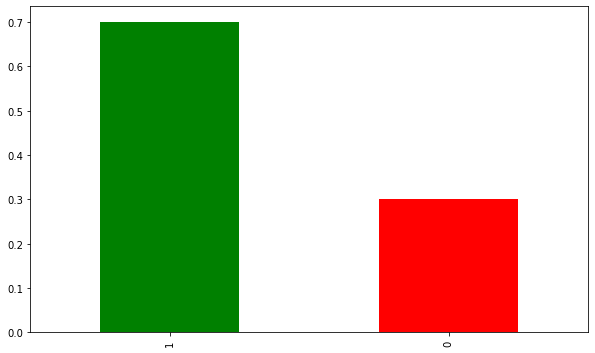

In [30]:
df_encoded['IsStatBarred'].value_counts(normalize=True).plot(kind='bar',figsize=(10,6),color=['green','red']);

In [31]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 406423 entries, 0 to 406422
Data columns (total 20 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   AccountID                  406423 non-null  int64  
 1   CurrentBalance             406423 non-null  float64
 2   DebtLoadPrincipal          406423 non-null  float64
 3   BalanceAtDebtLoad          406423 non-null  float64
 4   IsStatBarred               406423 non-null  int64  
 5   InBankruptcy               406423 non-null  int64  
 6   IsLegal                    406423 non-null  int64  
 7   NumLP_1.0                  406423 non-null  uint8  
 8   NumLP_2.0                  406423 non-null  uint8  
 9   NumLP_3.0                  406423 non-null  uint8  
 10  NumLP_4.0                  406423 non-null  uint8  
 11  EntityID_encoded           406423 non-null  int64  
 12  OriginalCreditor_encoded   406423 non-null  int64  
 13  PurchasePrice_encoded      40

# Train_Test_Split

### separating the target column ("y") from the feature columns ("x") is a fundamental data preprocessing step that enables you to train and evaluate machine learning models effectively. It ensures that your model learns from the available data while preserving the independence of the target variable for prediction or classification purposes.

In [32]:
x= df_encoded.drop("IsStatBarred",axis=1)
y= df_encoded['IsStatBarred']
x.shape , y.shape

((406423, 19), (406423,))

In [33]:
np.random.seed(42)

x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2)

x_train.shape , x_test.shape, y_train.shape,y_test.shape

((325138, 19), (81285, 19), (325138,), (81285,))

# Model Training

In [35]:
rf_grid = {
    "n_estimators": np.arange(100, 500, 50),  # Common values between 100 and 500
    "max_depth": [None, 5, 10],  # Consider smaller values like 5 or 10
    "min_samples_split": np.arange(2, 10, 1),  # Narrowed down the range
    "min_samples_leaf": np.arange(1, 10, 1)  # Narrowed down the range
}

# Initialize RandomizedSearchCV
np.random.seed(42)
rs_rf = RandomizedSearchCV(
    RandomForestClassifier(),
    param_distributions=rf_grid,
    cv=5,  # Number of cross-validation folds
    n_iter=50,  # Number of random combinations to try
    verbose=True,  # Print progress
    n_jobs=-1  # Use all available CPU cores
)

# Fit the RandomizedSearchCV to your data (replace x_train and y_train with your data)
rs_rf.fit(x_train, y_train)

# Print the best hyperparameters found by RandomizedSearchCV
print("Best Hyperparameters:")
print(rs_rf.best_params_)


Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Hyperparameters:
{'n_estimators': 450, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_depth': None}


In [36]:
df_encoded.head()

,AccountID,CurrentBalance,DebtLoadPrincipal,BalanceAtDebtLoad,IsStatBarred,InBankruptcy,IsLegal,NumLP_1.0,NumLP_2.0,NumLP_3.0,NumLP_4.0,EntityID_encoded,OriginalCreditor_encoded,PurchasePrice_encoded,ProductOrDebtType_encoded,CollectionStatus_encoded,CustomerAge_encoded,NumPhones_encoded,NumEmails_encoded,NumAddresses_encoded
0,3677,0.0,1160.20,1160.20,0,0,1,1,0,0,0,1,0,12,5,7,4,0,0,1
1,4276,182.9,182.90,182.90,1,0,0,1,0,0,0,0,11,12,5,1,2,0,0,1
2,8525,0.0,538.57,538.57,0,0,0,1,0,0,0,1,0,12,5,7,2,1,0,1
3,9859,8279.5,8279.50,8279.50,1,0,0,1,0,0,0,0,11,12,5,8,2,1,0,1
4,12807,0.0,523.00,523.00,1,0,1,1,0,0,0,1,0,12,5,7,4,2,0,1


### The provided code trains and tests multiple machine learning models, including Logistic Regression, K-Nearest Neighbors (KNN), and Random Forest, on a given dataset. It calculates the accuracy of each model in predicting the target variable. The results are compared and printed, allowing for the selection of the model with the highest accuracy for further analysis or deployment. This code serves as a valuable step in model selection and evaluation during the machine learning workflow.

In [37]:
models = {"Logistic Regression": LogisticRegression(),
          "KNN": KNeighborsClassifier(),
          "Random Forest": RandomForestClassifier()}

def fit_and_score(models,x_train,x_test,y_train,y_test):
    np.random.seed(42)
    model_scores = {}
    for name , model in models.items():
        model.fit(x_train,y_train)
        
        model_scores[name]=model.score(x_test,y_test)
    return model_scores

In [38]:
model_scores = fit_and_score(models=models,
                             x_train = x_train,
                             x_test = x_test,
                             y_train = y_train,
                             y_test = y_test)

model_scores

{'Logistic Regression': 0.7009411330503783,
 'KNN': 0.931032785876853,
 'Random Forest': 0.9746939779787168}

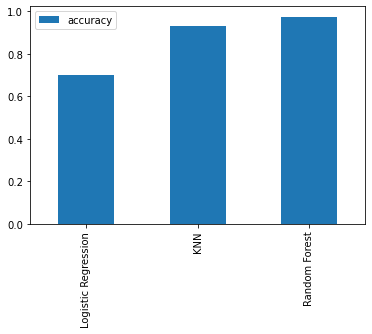

In [39]:
model_compare = pd.DataFrame(model_scores , index=['accuracy'])
model_compare.T.plot.bar();

# Model Evaluation

### the Random Forest model has been selected as the preferred model due to its superior accuracy in predicting the target variable

In [40]:
rs_rf.score(x_test,y_test)

0.9748785138709479

In [41]:
accuracy = rs_rf.score(x_test, y_test)
print(f"Accuracy on the test data: {accuracy:.2f}")

Accuracy on the test data: 0.97


### These evaluation metrics collectively provide valuable insights into the performance of the model. While accuracy reflects overall correctness, precision and recall offer a more nuanced view of how well the model classifies positive and negative instances. The F1 score considers both precision and recall, making it a useful metric for balancing trade-offs between false positives and false negatives.

In [42]:
y_preds = rs_rf.predict(x_test)
precision = precision_score(y_test, y_preds)
recall = recall_score(y_test, y_preds)
f1 = f1_score(y_test, y_preds)


In [43]:
print(f"Accuracy on the test data: {accuracy:.2f}")
print(f"Precision on the test data: {precision:.2f}")
print(f"Recall on the test data: {recall:.2f}")
print(f"F1 Score on the test data: {f1:.2f}")

Accuracy on the test data: 0.97
Precision on the test data: 0.98
Recall on the test data: 0.99
F1 Score on the test data: 0.98


# Model evaluation metrics 

### an AUC-ROC score of 1.00 suggests that the Random Forest model performs well in differentiating between the two classes

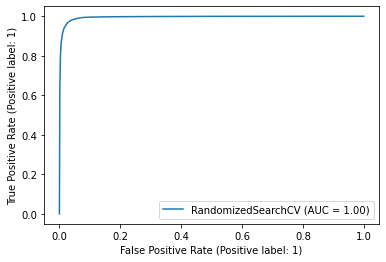

In [44]:
plot_roc_curve(rs_rf,x_test,y_test)

# Confusion matrix

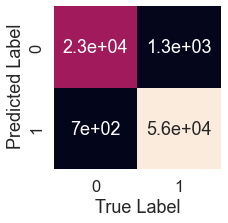

In [45]:
sns.set(font_scale=1.5)

def plot_conf_mat(y_test,y_preds):
    fig , ax=plt.subplots(figsize=(3,3))
    ax= sns.heatmap(confusion_matrix(y_test,y_preds),
                    annot=True,
                    cbar=False)
    plt.xlabel("True Label")
    plt.ylabel(" Predicted Label")
    
plot_conf_mat(y_test,y_preds)

# Classification Report

In [46]:
print(classification_report(y_test,y_preds))

              precision    recall  f1-score   support

           0       0.97      0.94      0.96     24309
           1       0.98      0.99      0.98     56976

    accuracy                           0.97     81285
   macro avg       0.97      0.97      0.97     81285
weighted avg       0.97      0.97      0.97     81285

